## 2a

In [14]:
from pathlib import Path
import xml.etree.ElementTree as ET
from PIL import Image
import os

class ImageProcessor:
    def __init__(self):
        # Initializing directory paths
        self.dataset_dir = r"C:\Users\injam\Downloads\DM_Assignment_1"
        self.img_dir = r"C:\Users\injam\Downloads\DM_Assignment_1\Images"
        self.annotation_dir = r"C:\Users\injam\Downloads\DM_Assignment_1\Annotations"
        self.cropped_dir = r"C:\Users\injam\Downloads\DM_Assignment_1\Cropped"

    def _extract_bounding_boxes(self, annotation_path):
        """Extract bounding boxes from XML annotation files."""
        tree = ET.parse(annotation_path)
        objects = tree.findall('object')

        # Extract bounding box coordinates for each object in the XML
        return [
            (
                int(bndbox.find('xmin').text),
                int(bndbox.find('ymin').text),
                int(bndbox.find('xmax').text),
                int(bndbox.find('ymax').text)
            )
            for o in objects for bndbox in [o.find('bndbox')]
        ]

    def _get_corresponding_image_path(self, annotation_path):
        """Generate the corresponding image path from the annotation path."""
        image_name = annotation_path.stem + '.jpg'
        breed_name = annotation_path.parent.name
        return Path(self.img_dir) / breed_name / image_name

    def process_images(self, breeds):
        """Process images for the provided breeds."""
        for breed in breeds:
            breed_annotations = list(Path(self.annotation_dir).joinpath(breed).glob('*'))
            print(f"Processing {len(breed_annotations)} annotations for breed: {breed}")  # Diagnostic print

            for annotation_path in breed_annotations:
                if annotation_path.is_file():  # Ensure we're not picking up subdirectories
                    self._process_annotation(annotation_path)

    def _process_annotation(self, annotation_path):
        """Process a single annotation file."""
        bounding_boxes = self._extract_bounding_boxes(annotation_path)
        image_path = self._get_corresponding_image_path(annotation_path)

        if not image_path.exists():
            print(f"Image file not found: {image_path}")
            return

        with Image.open(image_path) as img:
            for idx, bbox in enumerate(bounding_boxes):
                cropped_img = img.crop(bbox).resize((100, 100), Image.LANCZOS).convert('RGB')
                self._save_cropped_image(cropped_img, image_path, idx)

    def _save_cropped_image(self, img, original_image_path, index):
        """Save the cropped image to the specified directory."""
        rel_path = original_image_path.relative_to(self.img_dir)
        new_path = self.cropped_dir / rel_path.with_name(f"{rel_path.stem}-{index}.jpg")
        new_path.parent.mkdir(parents=True, exist_ok=True)

        img.save(new_path)
        print(f"Saved cropped image to {new_path}")


if __name__ == "__main__":
    base_dir = os.getcwd()
    processor = ImageProcessor()
    breeds_to_process = [
       'n02116738-African_hunting_dog',
        'n02100735-English_setter',
        'n02099849-Chesapeake_Bay_retriever',
        'n02093647-Bedlington_terrier'
    ]

    processor.process_images(breeds_to_process)




Processing 169 annotations for breed: n02116738-African_hunting_dog
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\Cropped\n02116738-African_hunting_dog\n02116738_10024-0.jpg
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\Cropped\n02116738-African_hunting_dog\n02116738_10038-0.jpg
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\Cropped\n02116738-African_hunting_dog\n02116738_10081-0.jpg
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\Cropped\n02116738-African_hunting_dog\n02116738_10169-0.jpg
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\Cropped\n02116738-African_hunting_dog\n02116738_10215-0.jpg
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\Cropped\n02116738-African_hunting_dog\n02116738_10469-0.jpg
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\Cropped\n02116738-African_hunting_dog\n02116738_10469-1.jpg
Saved cropped image to C:\Users\injam\Downloads\DM_Assignment_1\

## 2b

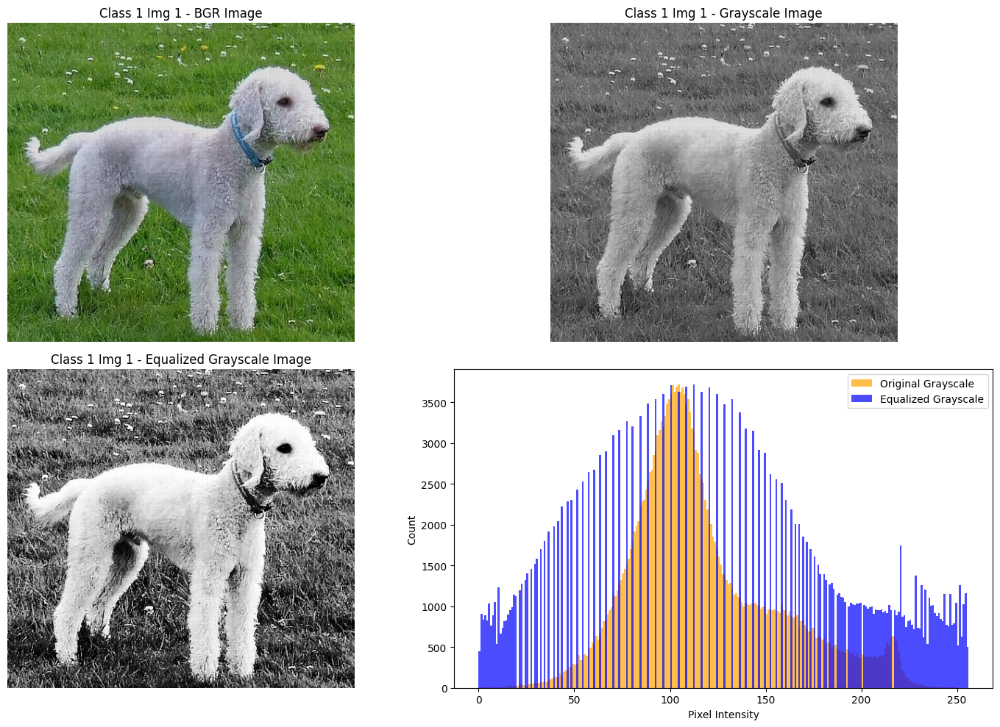

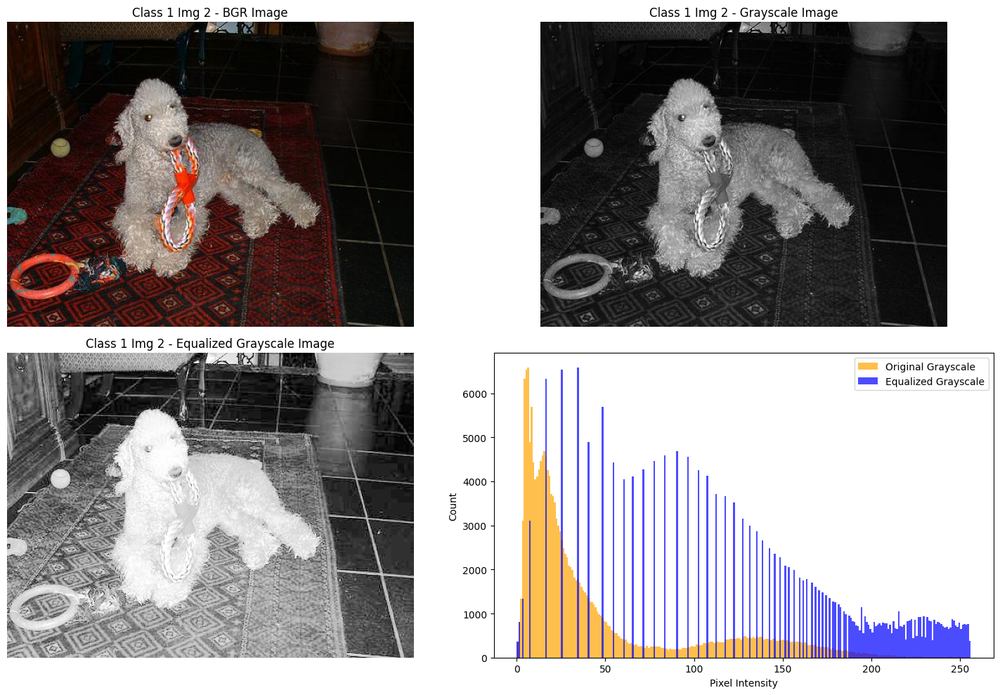

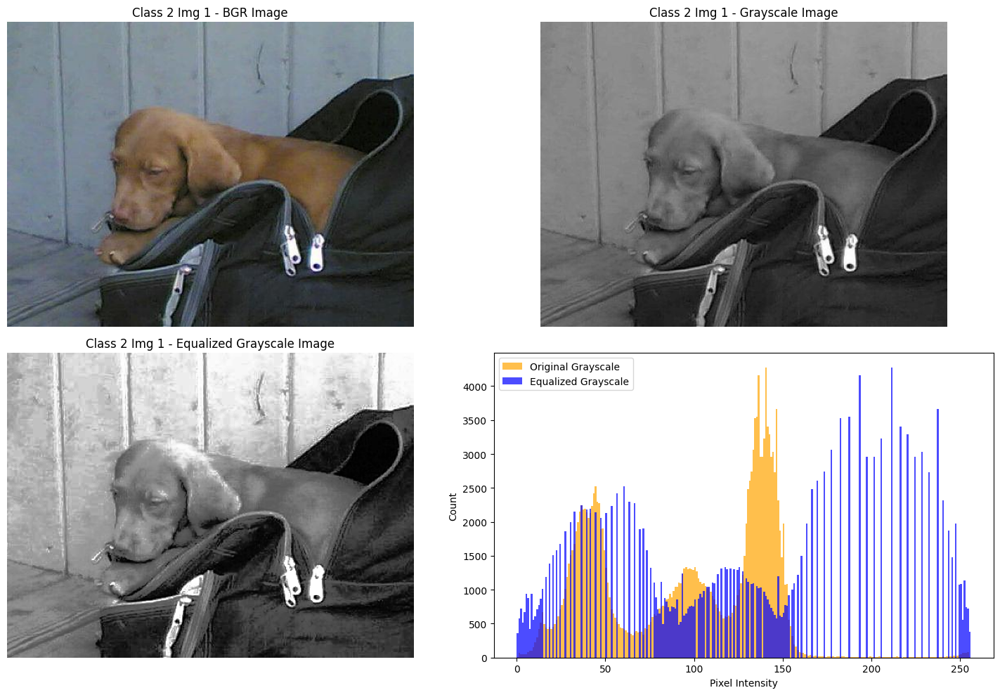

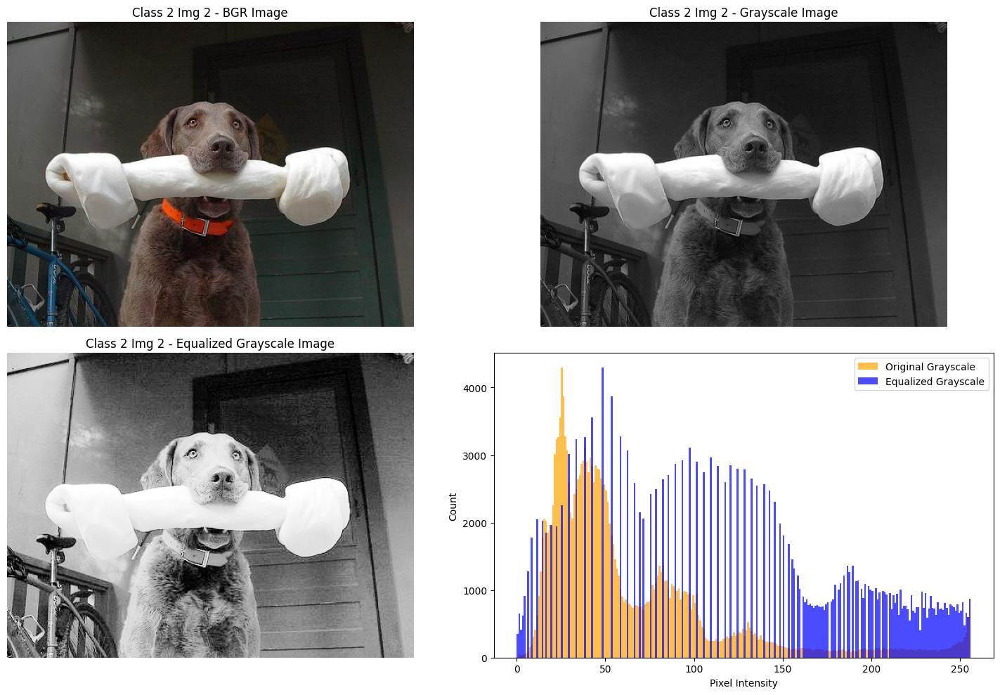

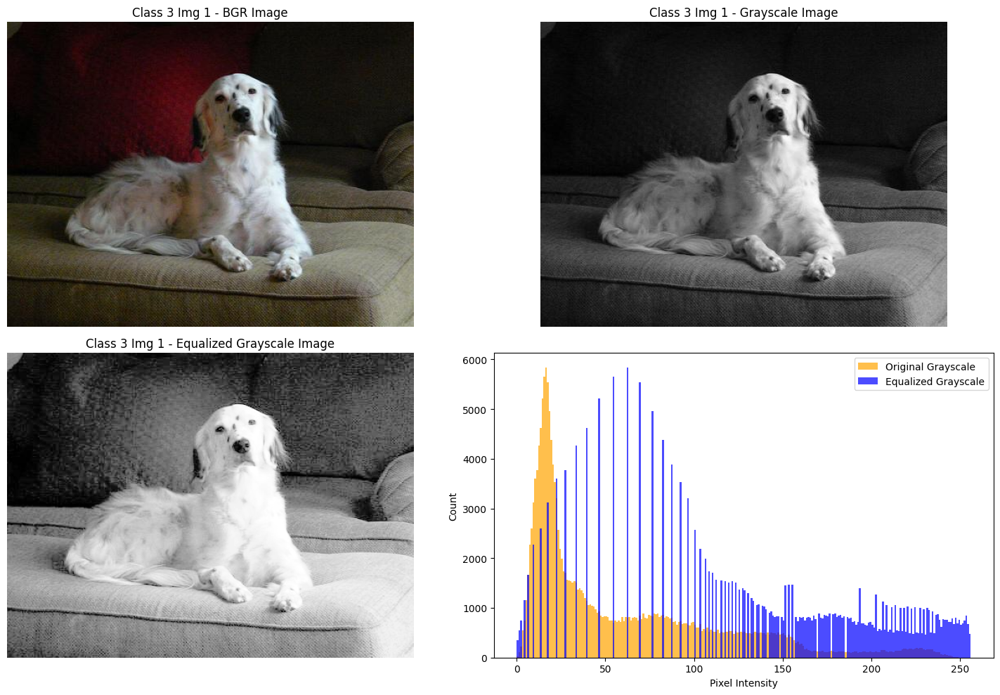

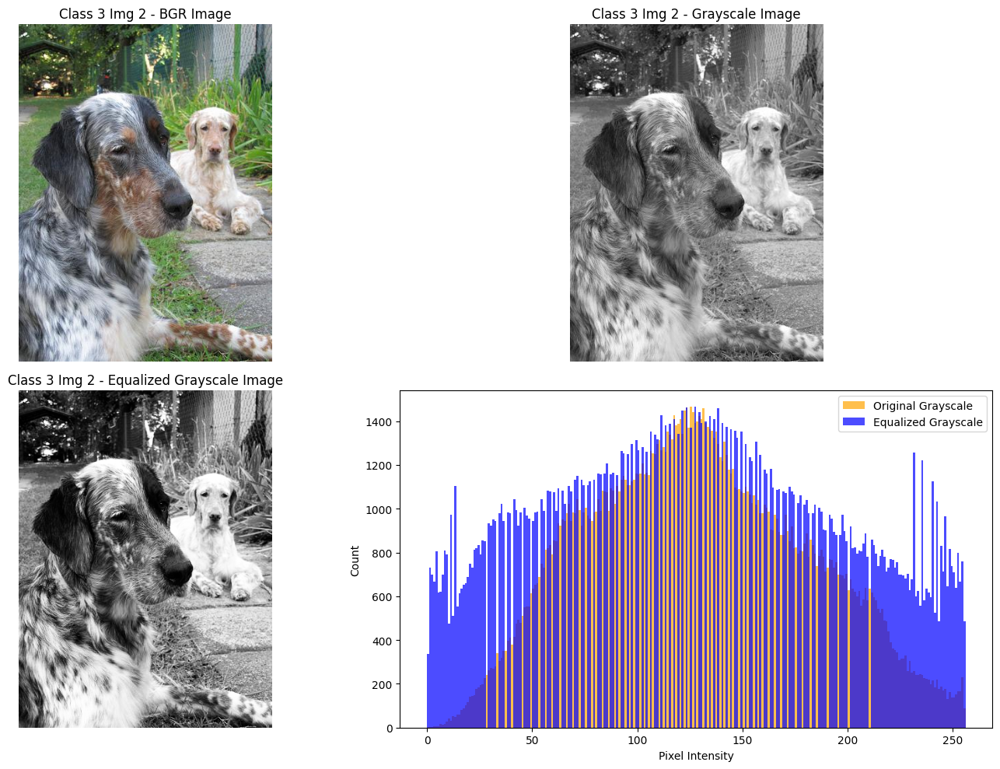

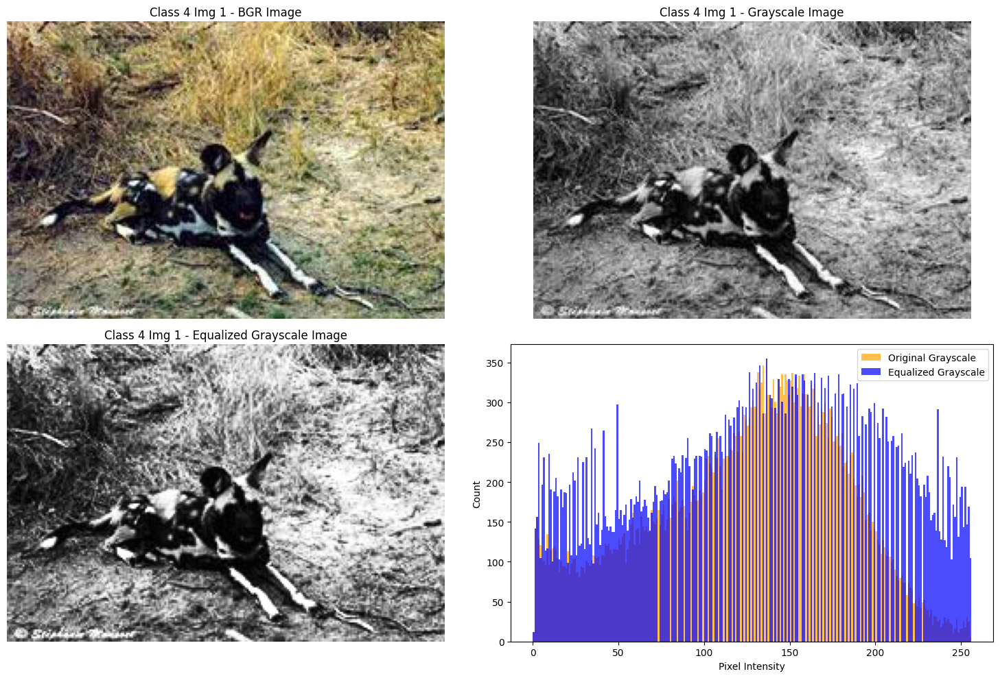

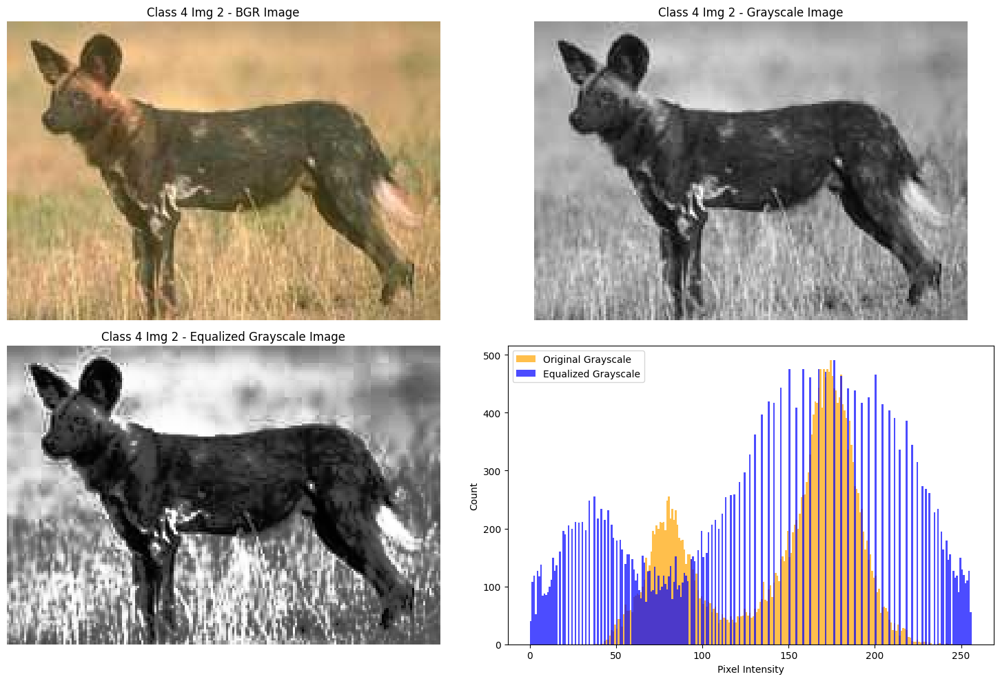

In [15]:
import cv2
import os
import matplotlib.pyplot as plt
from pathlib import Path

class ImageDataProcessor:

    def __init__(self, folders):
        self.folders = folders

    def load_images(self, num=2):
        """Load a fixed number of images from each folder."""
        images = []
        for folder in self.folders:
            image_files = [f for f in os.listdir(folder) if f.endswith('.jpg')]
            selected_files = image_files[:num]
            images += [cv2.imread(os.path.join(folder, f)) for f in selected_files]
        return images

    def convert_to_grayscale(self, images):
        """Convert images to grayscale."""
        return [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]

    def perform_histogram_equalization(self, images):
        """Perform histogram equalization."""
        return [cv2.equalizeHist(img) for img in images]

    @staticmethod
    def display_images_with_histogram(original, grayscale, equalized, title):
        """Display original, grayscale, and equalized images along with histograms."""
        plt.figure(figsize=(15, 10))

        # Top row: Original and Grayscale Image
        plt.subplot(2, 2, 1)
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.title(f"{title} - BGR Image")
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(grayscale, cmap='gray')
        plt.title(f"{title} - Grayscale Image")
        plt.axis('off')

        # Bottom row: Equalized Grayscale Image and Histograms
        plt.subplot(2, 2, 3)
        plt.imshow(equalized, cmap='gray')
        plt.title(f"{title} - Equalized Grayscale Image")
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.hist(grayscale.ravel(), 256, [0, 256], color='orange', alpha=0.7, label='Original Grayscale')
        plt.hist(equalized.ravel(), 256, [0, 256], color='blue', alpha=0.7, label='Equalized Grayscale')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Count')
        plt.legend()

        plt.tight_layout()
        plt.show()


if __name__ == "__main__":
    image_directories = [
        Path(r"C:\Users\injam\Downloads\DM_Assignment_1\Images\n02093647-Bedlington_terrier"),
        Path(r"C:\Users\injam\Downloads\DM_Assignment_1\Images\n02099849-Chesapeake_Bay_retriever"),
        Path(r"C:\Users\injam\Downloads\DM_Assignment_1\Images\n02100735-English_setter"),
        Path(r"C:\Users\injam\Downloads\DM_Assignment_1\Images\n02116738-African_hunting_dog")
    ]

    data_processor = ImageDataProcessor(image_directories)
    images_data_set = data_processor.load_images()
    grayscale_data_set = data_processor.convert_to_grayscale(images_data_set)
    equalized_data_set = data_processor.perform_histogram_equalization(grayscale_data_set)

    image_titles = [
        "Class 1 Img 1", "Class 1 Img 2",
        "Class 2 Img 1", "Class 2 Img 2",
        "Class 3 Img 1", "Class 3 Img 2",
        "Class 4 Img 1", "Class 4 Img 2"
    ]

    for idx, title in enumerate(image_titles):
        data_processor.display_images_with_histogram(images_data_set[idx], grayscale_data_set[idx], equalized_data_set[idx], title)


## 2c


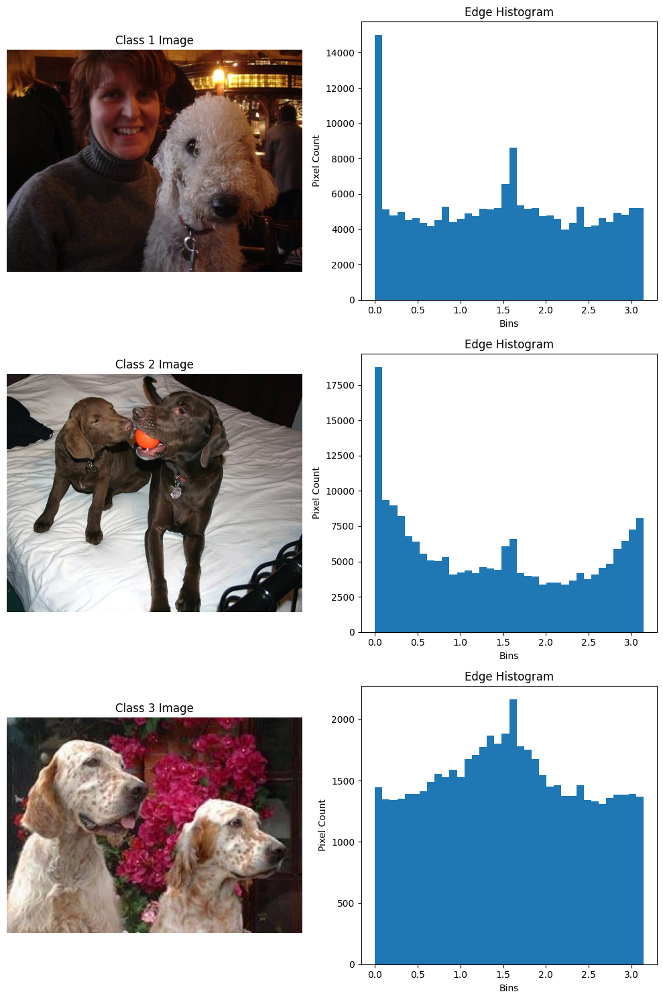

In [16]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, exposure

# Function to calculate angles between horizontal and vertical operators
def calculate_edge_angles(dx, dy):
    """Calculate the angles between horizontal and vertical operators."""
    return np.mod(np.arctan2(dy, dx), np.pi)

# Function to compute edge histogram for an image
def compute_image_edge_histogram(image):
    # Convert color image to grayscale
    grayscale_image = color.rgb2gray(image)
    
    # Compute edge angles using Sobel operators
    sobel_horizontal = filters.sobel_h(grayscale_image)
    sobel_vertical = filters.sobel_v(grayscale_image)
    edge_angles = calculate_edge_angles(sobel_horizontal, sobel_vertical)
    
    # Compute histogram with 36 bins for edge angles
    hist, bins = exposure.histogram(edge_angles, nbins=36)
    
    return hist, bins

# Load one image from each class
class1_img = io.imread(r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02093647-Bedlington_terrier\n02093647_642.jpg') 
class2_img = io.imread(r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02099849-Chesapeake_Bay_retriever\n02099849_1326.jpg')
class3_img = io.imread(r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02100735-English_setter\n02100735_1467.jpg')

# Compute edge histograms for each image
class1_hist, bins = compute_image_edge_histogram(class1_img)
class2_hist, bins = compute_image_edge_histogram(class2_img)
class3_hist, bins = compute_image_edge_histogram(class3_img)

# Plot images with their corresponding edge histograms
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 15))

# Plot class 1 image and its histogram
axes[0, 0].imshow(class1_img, cmap='gray')
axes[0, 0].set_title('Class 1 Image')
axes[0, 0].axis('off')
axes[0, 1].bar(bins, class1_hist, width=np.pi / 36)
axes[0, 1].set_title('Edge Histogram')
axes[0, 1].set_xlabel('Bins')
axes[0, 1].set_ylabel('Pixel Count')

# Plot class 2 image and its histogram
axes[1, 0].imshow(class2_img, cmap='gray')
axes[1, 0].set_title('Class 2 Image')
axes[1, 0].axis('off')
axes[1, 1].bar(bins, class2_hist, width=np.pi / 36)
axes[1, 1].set_title('Edge Histogram')
axes[1, 1].set_xlabel('Bins')
axes[1, 1].set_ylabel('Pixel Count')

# Plot class 3 image and its histogram
axes[2, 0].imshow(class3_img, cmap='gray')
axes[2, 0].set_title('Class 3 Image')
axes[2, 0].axis('off')
axes[2, 1].bar(bins, class3_hist, width=np.pi / 36)
axes[2, 1].set_title('Edge Histogram')
axes[2, 1].set_xlabel('Bins')
axes[2, 1].set_ylabel('Pixel Count')

plt.tight_layout()
plt.show()


## 2d


In [17]:
import numpy as np
from skimage import io, color, filters, exposure
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances, cosine_distances

class EdgeHistogramCalculator:
    def __init__(self):
        pass

    @staticmethod
    def calculate_angles(dx, dy):
        """Calculate the angles between horizontal and vertical operators."""
        return np.mod(np.arctan2(dy, dx), np.pi)

    @staticmethod
    def compute_edge_histogram(image):
        """Compute edge histogram for an image."""
        # Convert color image to grayscale
        gray_image = color.rgb2gray(image)
        
        # Compute edge angles using Sobel operators
        sobel_h = filters.sobel_h(gray_image)
        sobel_v = filters.sobel_v(gray_image)
        edge_angles = EdgeHistogramCalculator.calculate_angles(sobel_h, sobel_v)
        
        # Compute histogram with 36 bins for edge angles
        hist, bins = exposure.histogram(edge_angles, nbins=36)
        
        return hist

if __name__ == "__main__":
    # Load images
    image1_classA = io.imread(r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02093647-Bedlington_terrier\n02093647_1428.jpg') 
    image2_classA = io.imread(r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02093647-Bedlington_terrier\n02093647_1247.jpg')
    image1_classB = io.imread(r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02116738-African_hunting_dog\n02116738_2482.jpg')

    # Compute edge histograms for each image
    edge_calculator = EdgeHistogramCalculator()
    hist1_classA = edge_calculator.compute_edge_histogram(image1_classA)
    hist2_classA = edge_calculator.compute_edge_histogram(image2_classA)
    hist1_classB = edge_calculator.compute_edge_histogram(image1_classB)

    # Compute pairwise distances using different metrics
    dist_euclidean_same_class = euclidean_distances([hist1_classA], [hist2_classA])[0][0]
    dist_manhattan_same_class = manhattan_distances([hist1_classA], [hist2_classA])[0][0]
    dist_cosine_same_class = cosine_distances([hist1_classA], [hist2_classA])[0][0]

    dist_euclidean_diff_class = euclidean_distances([hist1_classA], [hist1_classB])[0][0]
    dist_manhattan_diff_class = manhattan_distances([hist1_classA], [hist1_classB])[0][0]
    dist_cosine_diff_class = cosine_distances([hist1_classA], [hist1_classB])[0][0]

    # Compute histogram intersection
    intersection_same_class = np.sum(np.minimum(hist1_classA, hist2_classA))
    intersection_diff_class = np.sum(np.minimum(hist1_classA, hist1_classB))

    # Print distances and intersection
    print("Distances for images from the same class:")
    print("Euclidean distance:", dist_euclidean_same_class)
    print("Manhattan distance:", dist_manhattan_same_class)
    print("Cosine distance:", dist_cosine_same_class)
    print("Histogram intersection:", intersection_same_class)

    print("\nDistances for images from different classes:")
    print("Euclidean distance:", dist_euclidean_diff_class)
    print("Manhattan distance:", dist_manhattan_diff_class)
    print("Cosine distance:", dist_cosine_diff_class)
    print("Histogram intersection:", intersection_diff_class)


Distances for images from the same class:
Euclidean distance: 201820.57551201264
Manhattan distance: 1186608.0
Cosine distance: 0.021329647693029252
Histogram intersection: 218880

Distances for images from different classes:
Euclidean distance: 110102.69751463858
Manhattan distance: 215654.0
Cosine distance: 0.592878562927217
Histogram intersection: 113113


## 2e

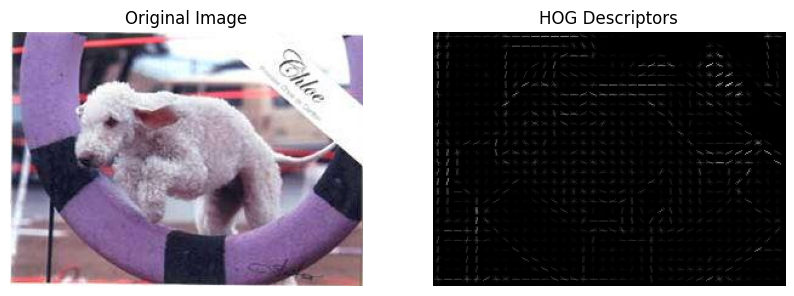

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, feature
from skimage import exposure

class ImageHOGVisualizer:
    def __init__(self, image_path):
        self.image_path = image_path

    def load_and_preprocess_image(self):
        """Load the image and preprocess it (convert to grayscale)."""
        image = io.imread(self.image_path)
        gray_image = color.rgb2gray(image)
        return image, gray_image

    def compute_and_visualize_hog(self, original_image, gray_image):
        """Compute HOG descriptors and visualize the original image and HOG descriptors."""
        hog_features, hog_image = feature.hog(gray_image, visualize=True)

        fig, ax = plt.subplots(1, 2, figsize=(10, 5))

        ax[0].imshow(original_image)
        ax[0].set_title('Original Image')
        ax[0].axis('off')

        ax[1].imshow(hog_image, cmap='gray')
        ax[1].set_title('HOG Descriptors')
        ax[1].axis('off')

        plt.show()

if __name__ == "__main__":
    image_path = r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02093647-Bedlington_terrier\n02093647_1558.jpg'
    
    image_hog_visualizer = ImageHOGVisualizer(image_path)
    original_image, grayscale_image = image_hog_visualizer.load_and_preprocess_image()
    image_hog_visualizer.compute_and_visualize_hog(original_image, grayscale_image)


## 2f

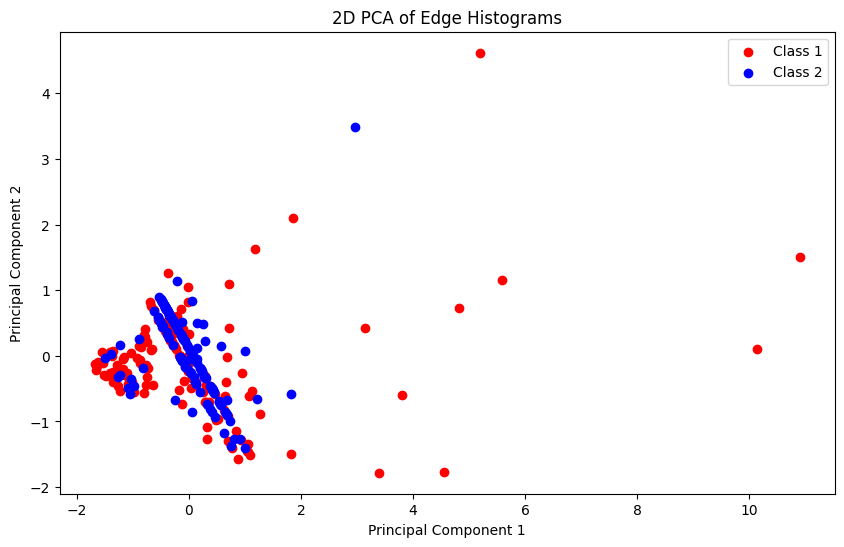

In [19]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

class EdgeHistogramPCAVisualizer:
    def __init__(self, class1_images_dir, class2_images_dir):
        self.class1_dir = Path(class1_images_dir)
        self.class2_dir = Path(class2_images_dir)

    @staticmethod
    def _compute_edge_histogram(image_path):
        """Compute edge histogram for an image."""
        img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
        edges = cv2.Canny(img, 100, 200)  # Compute edges using Canny edge detector
        hist, _ = np.histogram(edges, bins=36, range=(0, 255))
        return hist

    def _collect_histograms(self):
        """Collect edge histograms from both classes."""
        histograms = []
        class1_files = list(self.class1_dir.glob("*.jpg"))
        class2_files = list(self.class2_dir.glob("*.jpg"))
        all_files = class1_files + class2_files

        for file in all_files:
            hist = self._compute_edge_histogram(file)
            histograms.append(hist)
        return np.array(histograms), len(class1_files)

    def visualize_pca(self):
        """Perform PCA on histograms and visualize."""
        histograms, class1_count = self._collect_histograms()

        # Normalize the dataset
        histograms = StandardScaler().fit_transform(histograms)

        # PCA dimensionality reduction
        pca = PCA(n_components=2)
        principal_components = pca.fit_transform(histograms)

        # Plot the 2D points using two different colors
        plt.figure(figsize=(10, 6))
        plt.scatter(principal_components[:class1_count, 0], principal_components[:class1_count, 1], c='r', label="Class 1")
        plt.scatter(principal_components[class1_count:, 0], principal_components[class1_count:, 1], c='b', label="Class 2")
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.title('2D PCA of Edge Histograms')
        plt.legend()
        plt.show()

if __name__== "__main__":
    class1_images_path = r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02116738-African_hunting_dog'
    class2_images_path = r'C:\Users\injam\Downloads\DM_Assignment_1\Images\n02099849-Chesapeake_Bay_retriever'

    pca_visualizer = EdgeHistogramPCAVisualizer(class1_images_path, class2_images_path)
    pca_visualizer.visualize_pca()
